<a href="https://colab.research.google.com/github/kumarshivam99/Construction-Worker-Safety-System/blob/main/Flask_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/My Drive/deployment

/content/drive/My Drive/deployment


In [ ]:
%ls

haarcascade_frontalface_default.xml  static/          Untitled1.ipynb
helmet_covid.h5                      templates/       web.html
photo.jpg                            Untitled0.ipynb


In [ ]:
import os

if not os.path.exists('templates'):
  os.makedirs('templates')
if not os.path.exists('static'):
  os.makedirs('static')  

In [ ]:
!pip install flask-ngrok

In [ ]:
# Importing the libraries
from PIL import Image
from keras.applications.vgg16 import preprocess_input
import base64
from io import BytesIO
import json
import random
import cv2
from keras.models import load_model
import numpy as np
from google.colab.patches import cv2_imshow

In [ ]:
from keras.preprocessing import image
model = load_model('helmet_covid.h5')

In [ ]:
# Loading the cascades
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

In [ ]:
def face_extractor(img):
    # Function detects faces and returns the cropped face
    # If no face detected, it returns the input image
    
    #gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(img, 1.3, 5)
    
    if faces is ():
        return None
    
    # Crop all faces found
    for (x,y,w,h) in faces:
        cv2.rectangle(img,(x,y),(x+w,y+h),(0,255,255),2)
        cropped_face = img[y:y+h+40, x:x+w+40]

    return cropped_face

In [ ]:
def mask():

  frame = cv2.imread('static/img.png')

  face=face_extractor(frame)
  if type(face) is np.ndarray:
    face = cv2.resize(face, (224, 224))
    im = Image.fromarray(face, 'RGB')
    #Resizing into 128x128 because we trained the model with this image size.
    img_array = np.array(im)
        #Our keras model used a 4D tensor, (images x height x width x channel)
        #So changing dimension 128x128x3 into 1x128x128x3 
    img_array = np.expand_dims(img_array, axis=0)
        
    pred = model.predict(img_array)
    print(pred)
                     
    name="None matching"
        
    if(pred[0][0]>0.5):
      name='mask/Helmet' 
    elif(pred[0][1]>0.5):
      name='Mask/NO_helmet'
    elif(pred[0][2]>0.5):
      name='No mask/NO_helmet'   
    cv2.putText(frame,name, (100, 100), cv2.FONT_HERSHEY_COMPLEX, 1, (0,0,255), 2)
  else:
    cv2.putText(frame,"No face found", (100, 100), cv2.FONT_HERSHEY_COMPLEX, 1, (255,255,0), 2)

  cv2.imwrite('static/final.png', frame) 

  return True 

[[0.000000e+00 1.000000e+00 9.686865e-38]]


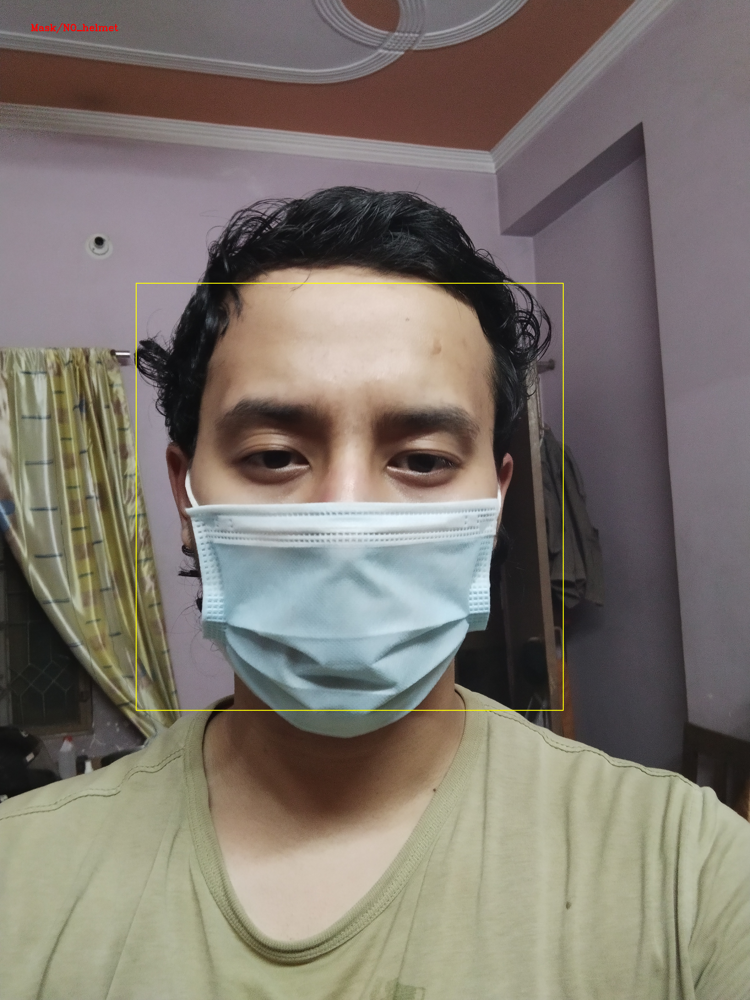

In [ ]:
if (mask()==True):
  frame = cv2.imread('static/final.png')
  cv2_imshow(frame)

In [ ]:
from flask_ngrok import run_with_ngrok
from flask import Flask,render_template,redirect,url_for, request

##Running the flask app

app =Flask(__name__)
#We need to start ngrok when the app is run

run_with_ngrok(app)
 

@app.route("/display")
def display():
  if (mask()==True):
    return render_template('display.html')   

app.config["IMAGE_UPLOADS"]="static"
@app.route("/", methods=["GET", "POST"])

def upload_image():

  if request.method == "POST":

    if request.files:
      image = request.files["image"]
      #image.save(os.path.join(app.config["IMAGE_UPLOADS"], image.filename))
      image.save("static/img.png")
      print("Image saved")
      return redirect(url_for("display")) 
      #return redirect(request.url)

  return render_template("upload_image.html")   



if __name__=="__main__":
  app.run()    

In [ ]:
display="""<!DOCTYPE html>
<html>  
    <head>  
        <title>Simple Web Page</title>  
    </head>  
    <body>  
        <center>  
            <h2 style="color: blue">  
                <i>SAFETY SOLUTION</i>  
            </h2>  
            <img src="static/final.png" />  
        </center>  
    </body>  
</html>  
"""

file=open("templates/display.html","w")  
file.write(display)
file.close()

In [ ]:
upload_image="""{% extends "base.html" %}

{% block title %}Upload{% endblock %}

{% block content %}

<div class="container">
  <div class="row">
    <div class="col">

      <h1>Upload an image</h1>
      <hr>

      <form action="/" method="POST" enctype="multipart/form-data">

        <div class="form-group">
          <label>Select image</label>
          <div class="custom-file">
            <input type="file" class="custom-file-input" name="image" id="image">
            <label class="custom-file-label" for="image">Select image...</label>
          </div>
        </div>

        <button type="submit" class="btn btn-primary">Upload</button>

      </form>

    </div>
  </div>
</div>

{% endblock %}
"""

file=open("templates/upload_image.html","w")  
file.write(upload_image)
file.close()